<a href="https://colab.research.google.com/github/pertvirt/hello_world/blob/master/kz_similar_images_finder_exp1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Load data

In [0]:
!unzip dataset

In [11]:
import glob

all_files = glob.glob("/content/dataset/**/*.jpg", recursive=True)

len(all_files)

1000

In [0]:
import PIL
from PIL import Image
import numpy as np

imgs_list = []
org_imgs_list = []
for image in all_files:
    imgs_list.append(np.array(Image.open(image).resize((224,224))))
    org_imgs_list.append(np.array(Image.open(image).resize((500,500))))

imgs_np = np.asarray(imgs_list)#, dtype=np.float32)# / 255
org_imgs_np = np.asarray(org_imgs_list)#, dtype=np.float32)# / 255

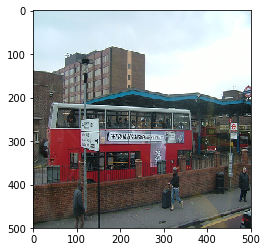

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.imshow(org_imgs_np[0])

from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

imgs = []
for file in all_files:
    img = image.load_img(file, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    imgs.append(x)
    
imgs = np.asarray(imgs)

In [17]:
imgs_np.shape

(1000, 224, 224, 3)

## Load base pretrained model (feature extractor)

In [18]:
import keras

# more recent versions of keras have even more pretrained models (ResNet150, ResNetV2, etc.)
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from keras.applications.densenet import DenseNet201, DenseNet121

#base = VGG19(weights='imagenet')
base = ResNet50(weights='imagenet')
#base = DenseNet201(weights='imagenet')
#base = InceptionV3(weights='imagenet')

Using TensorFlow backend.















102858752/102853048 [==============================] - 1s 0us/step


In [19]:
base.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
___________________________________________________________________________________________

## Create new model using base model and remove last fully connected layer (classification layer)

In [20]:
from keras.layers import Input
from keras import Model

model = Model(input=base.input, output=[base.layers[-2].output])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=[<tf.Tenso...)`
  after removing the cwd from sys.path.


## Preprocessed input

In [0]:
x = imgs_np.copy()

In [0]:
# each pretrained model requires different preprocess step
from keras.applications.resnet50 import preprocess_input
#from keras.applications.densenet import preprocess_input
#from keras.applications.vgg19 import preprocess_input

x = preprocess_input(x)

## Extract features (encoddings) using base model

In [0]:
features = model.predict(x)

In [24]:
features.shape

(1000, 2048)

## Find nearest neighbors using euclidean distance

In [25]:
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors(n_neighbors=5, metric='euclidean')
knn.fit(features)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='euclidean',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

In [0]:
predictions = knn.kneighbors(features, 10)

In [0]:
pred = predictions[1] # 0 - array of distances (ascending), 1 - array of coresponding indexes of similar images

In [28]:
pred

array([[  0, 985,   8, ...,  43, 461,  24],
       [  1,  40,  48, ...,   8,  47,  23],
       [  2,   3,  26, ...,  19,  37, 620],
       ...,
       [997, 976,  46, ..., 963, 987, 977],
       [998, 107, 985, ...,  21,  43,  33],
       [999, 473, 324, ..., 733, 666, 550]])

## Plot predictions

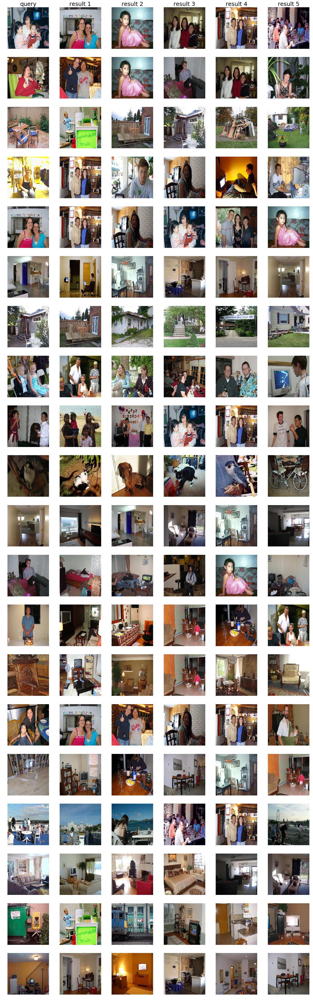

In [30]:
import matplotlib.pyplot as plt
%matplotlib inline

im_id = 650 # start plotting images from that ID
nm_neighbors = 5 # how many top similar images to show
nm_neighbors += 1 # ignore that - its needed for correct plotting
nm_img_to_plot = 20 # how many image queries to plot

fig, axes = plt.subplots(nm_img_to_plot, nm_neighbors, figsize=(nm_neighbors*4, nm_img_to_plot*4))
axes[0, 0].set_title("query", fontsize=25)
for i in range(1, nm_neighbors):
    axes[0, i].set_title("result %s" % i, fontsize=25) 
for m in range(0, nm_img_to_plot):    
    for n in range(0, nm_neighbors):
        axes[m, n].axis('off')
        axes[m, n].imshow(org_imgs_np[pred[im_id][n]])
    im_id += 1